In [1]:
import json
from typing import List

import numpy as np
import pandas as pd
import torch
from tqdm.notebook import tqdm
from rich import print
import matplotlib.pyplot as plt
from clip import tokenize
from transformers import CLIPVisionModelWithProjection, CLIPTextModelWithProjection, CLIPImageProcessor

from src.fashioniq_experiment.utils import element_wise_sum_original, get_combing_function_with_alpha, \
    convert_to_pivot_fiq, prepare_and_plot_recall_pivot, prepare_ground_truths, plot_retrieval_results_of_i, \
    found_better_than_original
from src.fashioniq_experiment.validate_notebook import fiq_val_retrieval_text_image_grid_search_clip, \
    compute_results_fiq_val_clip
from src.utils import device

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Set up the experiment</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Set up the cache for the experiment</div>

In [2]:
cache = {}

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [3]:
CLIP_NAME = 'laion/CLIP-ViT-L-14-laion2B-s32B-b82K'

In [4]:
clip_text_encoder = CLIPTextModelWithProjection.from_pretrained(CLIP_NAME, torch_dtype=torch.float32, projection_dim=768)
clip_text_encoder = clip_text_encoder.float().to(device)

print("clip text encoder loaded.")
clip_text_encoder.eval()

clip text encoder loaded.

CLIPTextModelWithProjection(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 768)
      (position_embedding): Embedding(77, 768)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,

In [5]:
clip_img_encoder = CLIPVisionModelWithProjection.from_pretrained(CLIP_NAME,torch_dtype=torch.float32, projection_dim=768)

clip_img_encoder = clip_img_encoder.float().to(device)
print("clip img encoder loaded.")
clip_img_encoder.eval()

clip img encoder loaded.

CLIPVisionModelWithProjection(
  (vision_model): CLIPVisionTransformer(
    (embeddings): CLIPVisionEmbeddings(
      (patch_embedding): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14), bias=False)
      (position_embedding): Embedding(257, 1024)
    )
    (pre_layrnorm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-23): 24 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
          )
          (layer_norm1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1024, out_features=40

In [6]:
print('CLIP preprocess pipeline is used')
preprocess = CLIPImageProcessor(
    crop_size={'height': 224, 'width': 224},
    do_center_crop=True,
    do_convert_rgb=True,
    do_normalize=True,
    do_rescale=True,
    do_resize=True,
    image_mean=[0.48145466, 0.4578275, 0.40821073],
    image_std=[0.26862954, 0.26130258, 0.27577711],
    resample=3,
    size={'shortest_edge': 224},
)

CLIP preprocess pipeline is used

In [7]:
clip_tokenizer = tokenize

In [8]:
combining_function_original = element_wise_sum_original

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the MLLM generated text captions</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions</div>

In [9]:
with open('../../../fashionIQ_dataset/labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
total_recall_list: List[List[pd.DataFrame]] = []

print(f'Total number of text captions: {len(text_captions)}')

Total number of text captions: 74357

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the FashionIQ dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the shirt category</div>

In [10]:
grid_search_alphas = np.arange(0, 1.05, 0.05)
shirt_recall_list: List[pd.DataFrame] = []

for alpha in tqdm(grid_search_alphas, desc="Grid Search alphas and betas"):
    shirt_recall = fiq_val_retrieval_text_image_grid_search_clip(
        'shirt',
        get_combing_function_with_alpha(alpha),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess,
        cache=cache,
    )
    
    shirt_recall_list.append(shirt_recall)

shirt_recall_at10, shirt_recall_at50 = convert_to_pivot_fiq(shirt_recall_list)

Grid Search alphas and betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [11]:
display(shirt_recall_at10, shirt_recall_at50)

alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,12.806673,13.150147,13.493621,13.984299,14.671247,15.161924,15.947007,16.928361,18.204121,19.528949,...,22.963689,25.368008,28.115800,30.912659,32.580963,32.973504,31.648675,28.508341,24.288519,22.080471
0.05,12.855741,13.199215,13.738960,13.984299,14.965652,15.554465,16.192345,17.517173,18.989205,20.215897,...,23.552503,26.545632,28.999019,31.648675,32.973504,33.709520,31.697744,29.146221,25.417075,22.767419
0.10,12.610403,12.953876,13.493621,13.837095,14.524043,15.505397,16.388616,17.615309,19.087340,20.608440,...,24.386653,27.477920,29.735035,32.335624,33.267909,32.777232,31.305200,28.410205,25.318941,22.669284
0.15,12.315996,12.757605,13.297351,13.788028,14.573111,15.652600,16.388616,17.762512,19.185476,21.050049,...,24.681060,27.625123,29.587832,31.746811,32.924435,31.697744,30.078509,27.428851,25.024533,22.669284
0.20,11.727183,12.610403,12.953876,13.297351,14.524043,15.407263,16.290481,17.615309,18.940137,20.804711,...,25.073603,27.232581,29.636899,30.618253,31.256133,30.176643,28.508341,26.398429,24.337585,22.325809
0.25,11.432777,11.825319,12.217861,13.199215,14.180569,14.916585,16.241413,17.271835,18.743867,20.314033,...,24.877331,26.987243,29.195291,29.587832,29.980373,28.900883,27.232581,25.368008,23.356232,21.638861
0.30,10.696761,11.089303,11.727183,12.659471,13.591756,14.278704,15.750736,16.879293,18.743867,20.215897,...,24.141315,25.907752,27.526987,28.606477,28.115800,27.134445,26.054955,23.699705,22.669284,21.050049
0.35,10.353287,10.893033,11.236507,12.168793,13.101080,13.837095,14.965652,16.437684,18.253189,19.823356,...,23.110893,24.730128,26.300293,26.496565,26.005888,25.220805,23.846909,22.276741,21.393523,19.774288
0.40,10.206085,10.843965,11.138371,11.530913,12.315996,13.199215,14.622179,15.947007,17.369971,19.381747,...,22.522080,24.043180,24.681060,24.779195,23.846909,23.061825,22.423945,21.246320,20.412169,19.087340


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,24.386653,24.582924,25.368008,25.858685,26.692837,27.968597,28.900883,30.029440,31.746811,34.200197,...,39.597645,42.541707,44.798821,47.939157,49.460256,50.147206,48.527968,45.044160,40.431795,35.770363
0.05,23.945044,24.582924,25.417075,25.956821,26.889107,28.017664,29.391560,30.471051,33.022571,34.838077,...,40.628067,43.326792,45.780176,48.184493,49.754661,49.950933,47.939157,44.946027,40.529931,36.555445
0.10,23.846909,24.337585,24.877331,25.907752,26.987243,27.821395,29.685965,31.108931,33.415112,35.426888,...,41.413149,43.768400,46.810597,48.380765,49.607459,48.969579,47.105005,44.651619,40.480864,36.997056
0.15,23.748773,24.288519,25.613347,26.104024,27.134445,28.361139,29.735035,31.501472,33.513248,35.574093,...,41.511285,43.964672,46.467125,48.380765,48.331699,47.399411,44.896957,42.737979,39.892051,36.261040
0.20,23.356232,24.337585,25.417075,26.349363,27.281648,28.557408,29.784101,31.354269,33.660451,35.966635,...,41.364083,44.013739,45.878312,46.908733,46.810597,46.172717,43.817469,40.971541,38.272816,35.132483
0.25,23.307164,24.092247,24.975467,26.104024,27.428851,28.999019,29.882237,31.403336,33.071640,35.230619,...,40.971541,43.081453,44.651619,45.583907,45.387635,43.719333,41.658488,39.352307,36.604515,33.905789
0.30,22.620216,23.895976,24.631992,25.760549,27.183512,28.704613,29.735035,31.010795,32.973504,35.083416,...,40.431795,42.149165,43.768400,44.455349,43.915603,41.560352,39.352307,37.438667,35.525024,32.924435
0.35,22.080471,23.159961,23.994112,25.318941,26.790971,27.968597,29.440629,30.716389,32.679096,35.132483,...,39.205104,41.216880,42.492640,42.787045,41.854760,39.842984,38.076547,35.623160,33.856723,31.452405
0.40,21.295388,22.423945,23.699705,24.533857,25.907752,27.183512,28.802747,29.882237,32.090285,34.396467,...,37.831208,39.646712,40.922472,40.824339,39.597645,37.634936,35.868499,33.611384,32.188421,30.225712


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the dress category</div>

In [12]:
grid_search_alphas = np.arange(0, 1.05, 0.05)
dress_recall_list: List[pd.DataFrame] = []

for alpha in tqdm(grid_search_alphas, desc="Grid Search alphas and betas"):
    dress_recall = fiq_val_retrieval_text_image_grid_search_clip(
        'dress',
        get_combing_function_with_alpha(alpha),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess,
        cache=cache,
    )
    
    dress_recall_list.append(dress_recall)

dress_recall_at10, dress_recall_at50 = convert_to_pivot_fiq(dress_recall_list)

Grid Search alphas and betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [13]:
display(dress_recall_at10, dress_recall_at50)

alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,5.156172,5.503223,5.602380,6.296480,6.990580,7.337630,7.932573,8.924145,9.816559,11.551809,...,16.212197,18.889439,22.012891,24.888448,26.722854,27.912742,27.416956,25.681704,21.864155,17.649975
0.05,5.156172,5.354487,6.098166,6.494794,7.139315,7.734258,8.477937,9.122459,10.560238,11.898860,...,16.261774,18.691126,21.814576,24.144769,25.929597,27.020326,26.871592,25.185919,21.913733,18.542390
0.10,5.354487,5.751115,6.197323,6.494794,7.139315,7.684680,8.378781,9.370352,10.213188,11.700545,...,16.013882,18.591969,20.971741,23.797719,25.136340,25.880021,25.632128,23.847298,21.417947,18.046604
0.15,5.304908,5.651958,5.999009,6.296480,6.792266,7.535944,8.329201,9.221616,10.163610,11.452653,...,14.923154,17.600396,20.029747,22.459097,23.401091,24.045612,24.095191,22.806148,20.327219,17.699553
0.20,4.858701,5.007437,5.701537,6.098166,6.643530,6.891423,7.585523,8.676252,9.866138,10.461081,...,14.328210,16.757561,18.740705,20.723847,21.665840,22.558255,21.913733,20.773426,18.641546,17.104611
0.25,4.511651,4.759544,5.106594,5.552801,5.999009,6.593952,7.535944,8.775409,9.568667,10.659395,...,13.832425,15.666832,17.600396,18.740705,20.029747,20.178483,20.079325,18.839861,18.046604,16.261774
0.30,4.313337,4.412494,4.462072,4.908280,5.404066,6.246901,7.139315,8.230045,9.122459,10.262766,...,13.039167,15.418939,16.559246,17.699553,18.195340,18.492810,18.145761,17.302924,16.360933,14.972731
0.35,4.214180,4.164601,4.362915,4.511651,5.057015,5.949430,6.742688,7.684680,8.577095,9.519088,...,12.146752,13.882002,15.319782,16.559246,17.154190,17.005454,17.104611,16.212197,15.220624,13.882002
0.40,3.916708,3.916708,4.263758,4.313337,4.610808,5.007437,5.999009,6.841844,7.882994,9.023302,...,11.700545,13.287060,14.278631,15.220624,15.964304,15.765989,15.617253,14.774418,13.683689,12.741695


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,15.071888,15.914725,16.509669,17.451660,18.492810,19.484383,20.823005,22.062469,24.095191,26.822013,...,32.721865,36.341101,40.208229,43.480417,47.149232,48.388696,49.033219,46.405554,42.141795,36.638573
0.05,14.675260,15.369360,16.261774,17.055032,17.997025,19.038175,20.277640,21.764998,24.392663,26.970750,...,33.118492,36.985621,40.654439,43.827465,47.347546,48.239961,48.239961,46.504709,42.538422,37.084779
0.10,14.278631,15.121467,16.013882,16.757561,17.699553,18.492810,19.732276,21.764998,23.847298,26.177493,...,33.068913,37.233517,40.109074,43.381259,45.711452,47.297966,46.306396,44.273674,41.249380,36.588994
0.15,13.832425,14.675260,15.121467,16.212197,17.104611,18.195340,19.881012,21.120475,23.054041,26.078334,...,32.226080,35.498264,39.216658,41.695589,43.529996,44.620723,43.629152,41.745165,38.968766,35.399106
0.20,13.336639,14.328210,14.873575,15.716411,16.757561,17.699553,18.591969,20.773426,22.657412,25.433812,...,30.441248,33.961329,36.688152,39.067924,40.654439,41.001487,40.803173,38.869607,36.539415,33.911750
0.25,12.989588,13.485375,13.782845,14.724839,15.518096,16.906297,18.244918,19.682696,21.616262,24.590977,...,29.251364,32.077342,34.308380,35.994050,37.580565,37.729302,37.878036,36.787307,34.903321,31.879029
0.30,12.097174,12.692118,13.435796,13.882002,15.022311,16.013882,17.203768,18.691126,20.525533,23.450670,...,27.714428,29.796728,31.432822,33.316806,34.754586,35.052058,34.853745,33.911750,31.482399,29.400098
0.35,11.303917,11.948438,12.692118,13.287060,14.328210,14.923154,16.162618,17.699553,19.484383,22.112048,...,26.375806,28.111055,29.846308,30.738720,31.730291,31.978184,31.829450,31.234506,29.747149,27.714428
0.40,10.163610,10.857709,11.650967,12.493803,13.088746,14.377789,15.220624,16.559246,18.889439,20.723847,...,24.690133,25.880021,26.970750,28.111055,28.705999,29.697570,29.251364,28.953892,27.714428,26.028755


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the toptee category</div>

In [14]:
grid_search_alphas = np.arange(0, 1.05, 0.05)
toptee_recall_list: List[pd.DataFrame] = []

for alpha in tqdm(grid_search_alphas, desc="Grid Search alphas and betas"):
    toptee_recall = fiq_val_retrieval_text_image_grid_search_clip(
        'toptee',
        get_combing_function_with_alpha(alpha),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess,
        cache=cache,
    )
    
    toptee_recall_list.append(toptee_recall)
    
toptee_recall_at10, toptee_recall_at50 = convert_to_pivot_fiq(toptee_recall_list)

Grid Search alphas and betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [15]:
display(toptee_recall_at10, toptee_recall_at50)

alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,8.720041,9.026007,9.433962,10.045895,11.116777,12.289649,13.666497,14.533402,16.216215,18.306985,...,24.171340,27.282000,30.035695,33.707291,37.021929,36.868945,35.645080,31.922489,28.556859,25.038245
0.05,8.618052,9.077001,9.535951,9.943906,11.116777,12.391637,13.513513,14.737380,16.981132,19.020908,...,24.834268,27.791944,30.851606,33.962265,36.359000,36.715961,36.002040,33.044365,29.117796,25.956145
0.10,8.465069,8.975013,9.280979,9.994900,11.065783,12.442631,13.360530,15.094340,16.369200,18.765935,...,24.987252,27.536970,31.004590,34.217235,36.002040,35.951045,35.186130,32.330444,29.015809,26.058134
0.15,8.414075,8.516064,9.229985,9.739929,10.963794,12.136665,13.258542,14.839368,16.165222,18.663947,...,24.834268,27.689955,30.494645,33.248344,34.625190,34.931159,33.248344,31.310555,28.709841,26.364100
0.20,7.904130,8.108108,8.669046,9.382968,10.249873,11.422744,12.748598,14.329425,16.114227,18.663947,...,24.579297,27.434981,29.831719,31.973484,33.299336,32.789394,31.310555,30.239674,28.964815,26.058134
0.25,7.445181,7.751147,8.414075,8.975013,9.892911,11.014789,12.391637,14.023457,16.012238,18.154003,...,23.916370,26.823050,28.811830,30.596635,31.565529,30.647629,30.239674,29.525751,27.689955,25.344211
0.30,7.139215,7.496175,7.955125,8.771035,9.535951,10.504845,11.881693,13.513513,15.553290,17.797042,...,22.896482,25.752166,27.332994,28.862825,29.066804,28.913820,28.199899,27.893931,26.466089,24.018358
0.35,6.578276,6.935237,7.598164,8.261091,9.127996,10.147884,11.473738,13.207547,15.298317,17.746048,...,22.029577,24.834268,25.650179,26.721060,26.772055,27.282000,26.721060,26.415095,24.375318,22.386537
0.40,6.272310,6.527282,7.037226,7.700153,8.567058,9.229985,10.708822,12.697603,14.533402,16.675165,...,21.927588,23.559408,24.273330,25.293219,25.191230,25.344211,25.344211,24.171340,22.794493,21.213667


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,19.275880,20.193778,20.856705,22.080570,23.304437,24.936257,26.670066,28.505865,31.259561,34.319225,...,41.815400,45.945945,49.311575,54.105049,56.552780,57.572669,56.501782,53.034168,48.648649,43.957165
0.05,19.071902,19.887812,20.652728,22.029577,23.457420,25.191230,26.874045,29.015809,32.024476,35.237125,...,42.835289,47.016829,51.198369,54.818970,56.858748,57.827640,56.144822,53.340131,49.107599,44.110149
0.10,19.224885,19.785823,20.856705,21.876593,23.763385,25.293219,26.772055,29.678735,32.534420,36.104029,...,43.651199,47.577766,51.759309,54.614991,56.348801,56.705761,55.481899,52.371240,48.750636,44.212136
0.15,18.765935,19.836818,20.703723,21.774605,23.610403,25.446200,27.180010,30.086690,32.636410,36.257011,...,43.039265,47.169811,50.994390,54.156041,55.226928,55.175930,53.544110,50.994390,47.985721,43.804181
0.20,18.510965,19.377868,20.397756,21.366650,23.508415,25.140235,27.027026,30.443650,32.585415,36.155024,...,42.376339,46.455890,50.331461,52.371240,53.187150,53.136158,51.402348,49.209586,45.996940,42.580315
0.25,18.204997,19.275880,19.836818,20.856705,22.692505,24.732280,26.670066,29.780725,32.381439,36.104029,...,42.223355,45.436001,48.342681,50.229472,50.790411,50.331461,49.107599,46.659866,43.957165,41.560429
0.30,17.287098,18.459970,19.377868,20.397756,22.182560,24.426313,25.956145,29.168791,31.667516,34.727180,...,41.203469,44.059154,46.455890,47.577766,47.781745,47.373790,45.690975,44.212136,41.917390,40.438551
0.35,16.522183,17.899030,18.867925,20.091790,21.825600,23.610403,25.242224,28.148904,30.902600,33.809280,...,39.163691,42.223355,44.161141,45.385009,45.588985,44.773075,43.345231,41.611424,39.571646,38.806731
0.40,15.910250,16.879143,18.103008,19.071902,20.907700,22.641510,23.814380,27.027026,29.933706,32.534420,...,38.092810,40.285569,42.376339,42.529321,42.478326,42.325345,40.897501,39.265680,37.531871,36.562979


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the average recall at 10 and 50 for all categories for alpha and beta</div>

In [16]:
average_recall_at10 = (shirt_recall_at10 + dress_recall_at10 + toptee_recall_at10) / 3
average_recall_at50 = (shirt_recall_at50 + dress_recall_at50 + toptee_recall_at50) / 3

In [17]:
print("Average Recall@10 for each alpha across all alphas:")
average_recall_at10

Average Recall@10 for each alpha across all alphas:

alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,8.894296,9.226459,9.509988,10.108891,10.926201,11.596401,12.515359,13.461969,14.745632,16.462581,...,21.115742,23.846482,26.721462,29.836133,32.108582,32.585064,31.570237,28.704178,24.903178,21.589564
0.05,8.876655,9.210234,9.791026,10.141000,11.073915,11.893454,12.727932,13.792337,15.510192,17.045221,...,21.549515,24.342901,27.221733,29.918569,31.754034,32.481936,31.523792,29.125502,25.482868,22.421984
0.10,8.809986,9.226668,9.657308,10.108930,10.909714,11.877570,12.709309,14.026667,15.223243,17.024974,...,21.795929,24.535620,27.237122,30.116860,31.468763,31.536099,30.707819,28.195983,25.250899,22.258008
0.15,8.678326,8.975209,9.508781,9.941479,10.776390,11.775070,12.658787,13.941165,15.171436,17.055550,...,21.479494,24.305158,26.704075,29.151417,30.316905,30.224838,29.140682,27.181851,24.687198,22.244312
0.20,8.163338,8.575316,9.108153,9.592828,10.472482,11.240476,12.208201,13.540329,14.973501,16.643246,...,21.327037,23.808375,26.069774,27.771861,28.740436,28.508097,27.244210,25.803843,23.981315,21.829518
0.25,7.796537,8.112003,8.579510,9.242343,10.024163,10.841775,12.056332,13.356900,14.774924,16.375810,...,20.875375,23.159042,25.202506,26.308390,27.191883,26.575665,25.850527,24.577873,23.030930,21.081615
0.30,7.383104,7.665991,8.048127,8.779595,9.510591,10.343483,11.590581,12.874284,14.473205,16.091902,...,20.025655,22.359619,23.806409,25.056285,25.125981,24.847025,24.133538,22.965520,21.832102,20.013713
0.35,7.048581,7.330957,7.732529,8.313845,9.095364,9.978136,11.060692,12.443304,14.042867,15.696164,...,19.095741,21.148799,22.423418,23.258957,23.310711,23.169420,22.557527,21.634678,20.329822,18.680943
0.40,6.798368,7.095985,7.479785,7.848134,8.497954,9.145545,10.443337,11.828818,13.262122,15.026738,...,18.716738,20.296549,21.077674,21.764346,21.667481,21.390675,21.128470,20.064026,18.963450,17.680901


In [18]:
print("Average Recall@50 for each beta across all alphas:")
average_recall_at50

Average Recall@50 for each beta across all alphas:

alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,19.578140,20.230476,20.911461,21.796972,22.830028,24.129746,25.464651,26.865924,29.033854,31.780478,...,38.044970,41.609584,44.772875,48.508208,51.054089,52.036190,51.354323,48.161294,43.740746,38.788700
0.05,19.230735,19.946699,20.777192,21.680477,22.781184,24.082356,25.514415,27.083953,29.813236,32.348651,...,38.860616,42.443081,45.877661,48.943643,51.320318,52.006178,50.774647,48.263622,44.058651,39.250124
0.10,19.116808,19.748292,20.582639,21.513969,22.816727,23.869141,25.396765,27.517555,29.932277,32.569470,...,39.377754,42.859894,46.226327,48.792338,50.555904,50.991102,49.631100,47.098844,43.493627,39.266062
0.15,18.782378,19.600199,20.479512,21.363609,22.616486,24.000893,25.598685,27.569546,29.734566,32.636480,...,38.925543,42.210916,45.559391,48.077465,49.029541,49.065354,47.356740,45.159178,42.282179,38.488109
0.20,18.401279,19.347888,20.229468,21.144141,22.515875,23.799065,25.134365,27.523782,29.634426,32.518490,...,38.060557,41.476986,44.299308,46.115966,46.884062,46.770121,45.340997,43.016912,40.269724,37.208183
0.25,18.167250,18.951167,19.531710,20.561856,21.879817,23.545865,24.932407,26.955586,29.023114,31.975208,...,37.482087,40.198266,42.434226,43.935810,44.586203,43.926699,42.881375,40.933160,38.488333,35.781749
0.30,17.334829,18.349354,19.148552,20.013436,21.462794,23.048269,24.298316,26.290237,28.388851,31.087089,...,36.449897,38.668349,40.552371,41.783307,42.150644,41.328733,39.965675,38.520851,36.308271,34.254361
0.35,16.635523,17.669143,18.518052,19.565930,20.981593,22.167385,23.615157,25.521616,27.688693,30.351270,...,34.914867,37.183764,38.833363,39.636925,39.724679,38.864748,37.750409,36.156363,34.391839,32.657855
0.40,15.789749,16.720266,17.817893,18.699854,19.968066,21.400937,22.612584,24.489503,26.971143,29.218245,...,33.538050,35.270767,36.756520,37.154905,36.927324,36.552617,35.339121,33.943652,32.478240,30.939149


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the recall at 10 and 50 for all categories</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [19]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

/tmp/ipykernel_491271/3408074174.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Shirt</div>

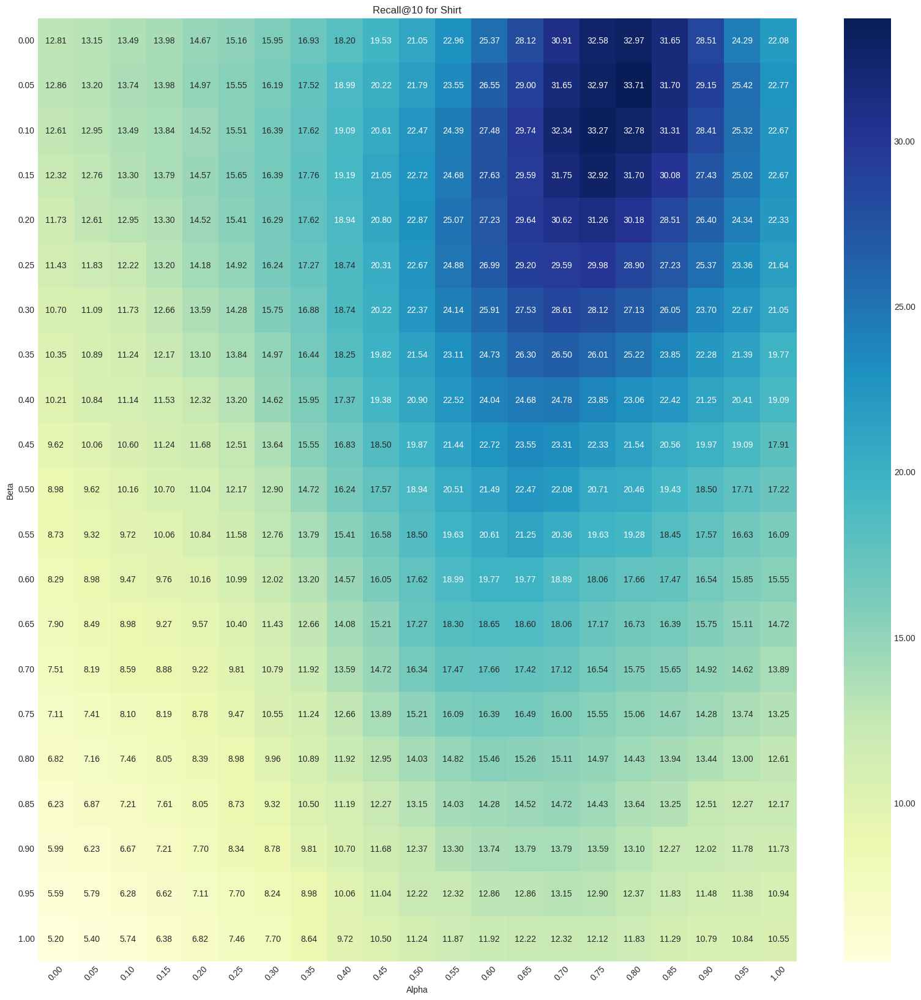

In [20]:
prepare_and_plot_recall_pivot(shirt_recall_at10, "Recall@10 for Shirt")

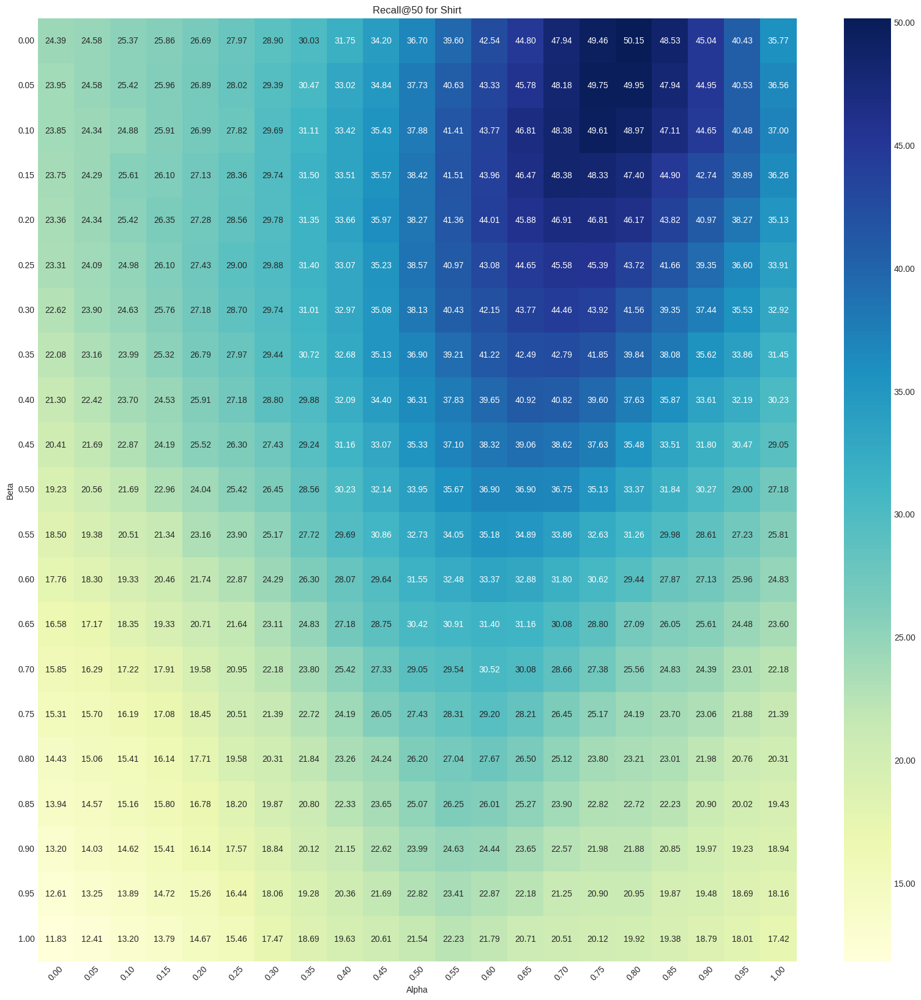

In [21]:
prepare_and_plot_recall_pivot(shirt_recall_at50, "Recall@50 for Shirt")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Dress</div>

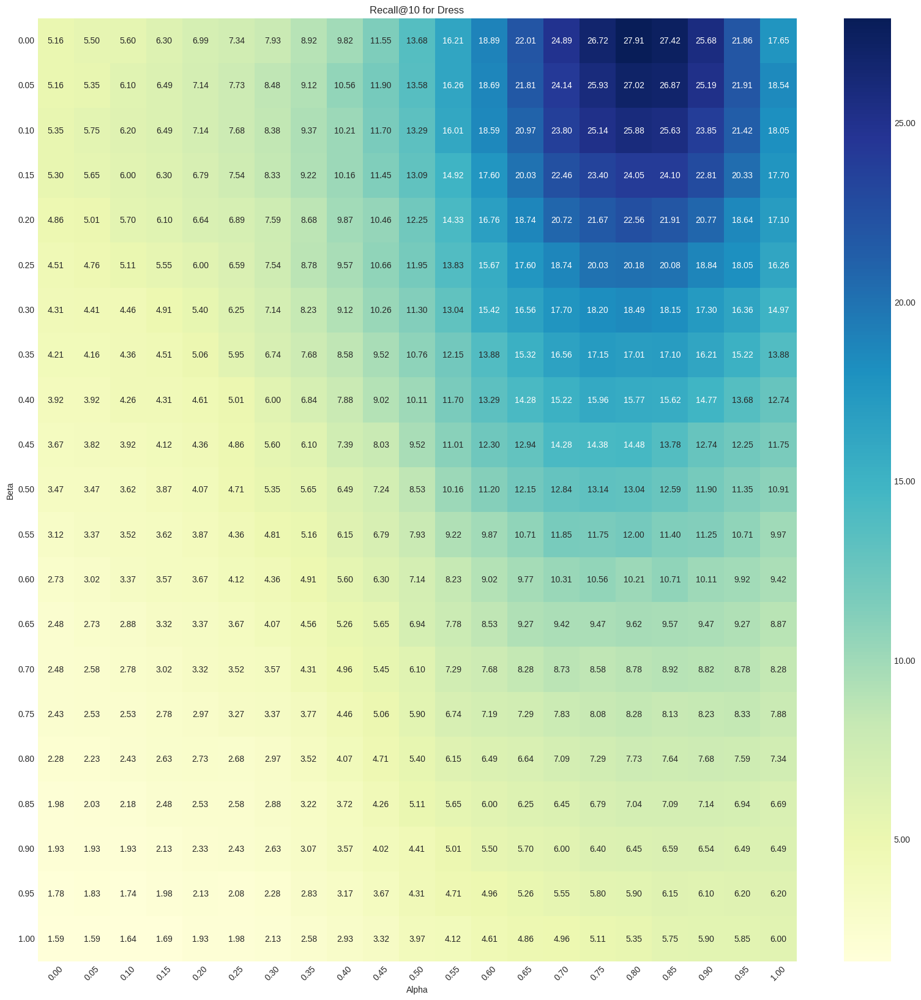

In [22]:
prepare_and_plot_recall_pivot(dress_recall_at10, "Recall@10 for Dress")

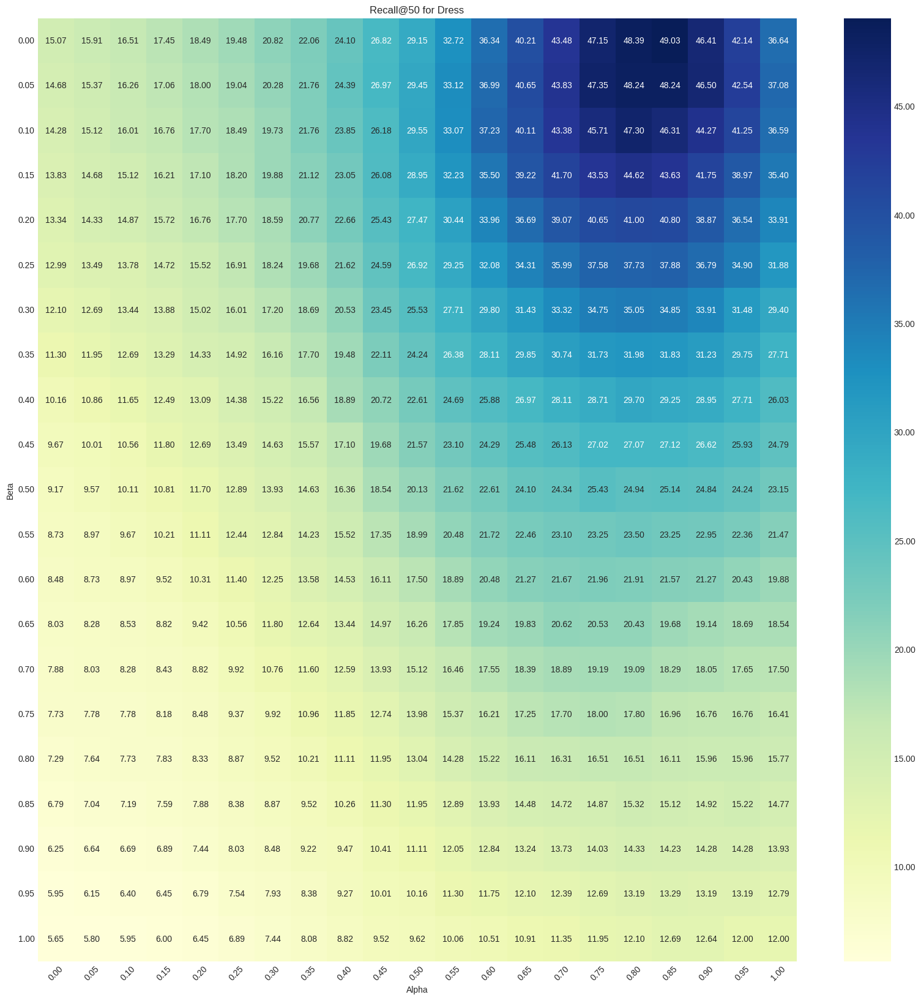

In [23]:
prepare_and_plot_recall_pivot(dress_recall_at50, "Recall@50 for Dress")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for TopTee</div>

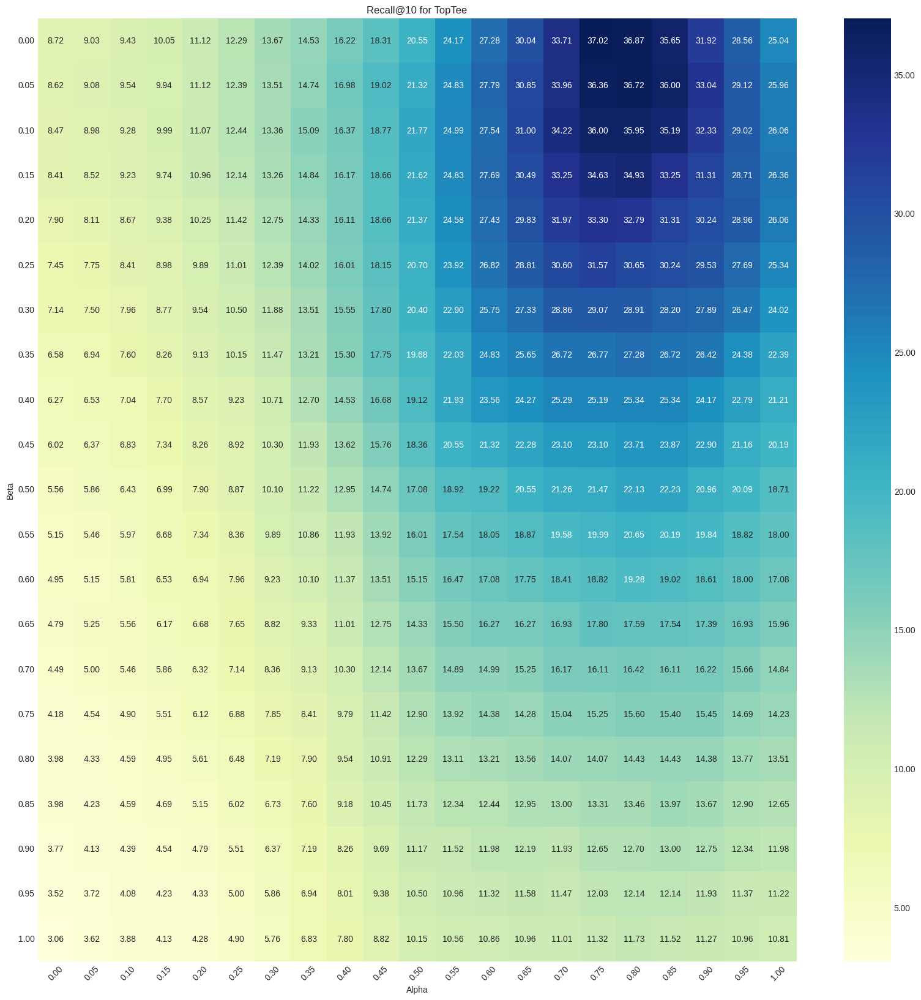

In [24]:
prepare_and_plot_recall_pivot(toptee_recall_at10, "Recall@10 for TopTee")

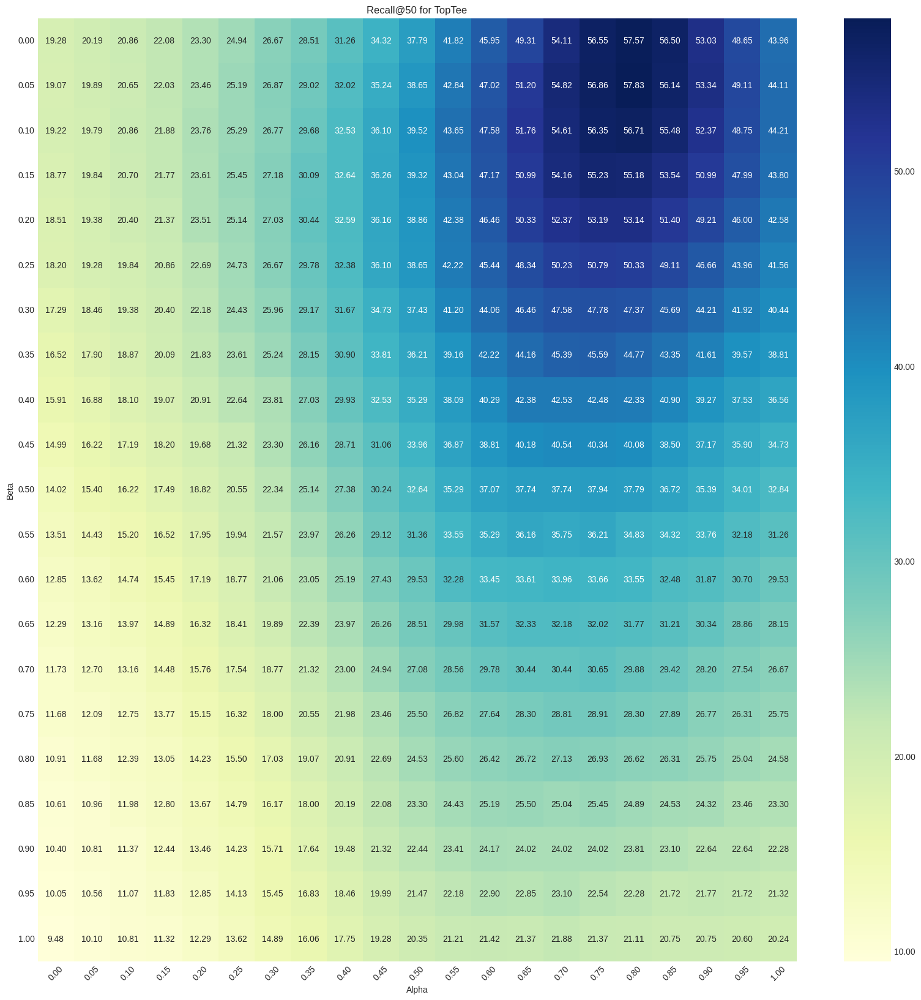

In [25]:
prepare_and_plot_recall_pivot(toptee_recall_at50, "Recall@50 for TopTee")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the average recall at 10 and 50 for all categories</div>

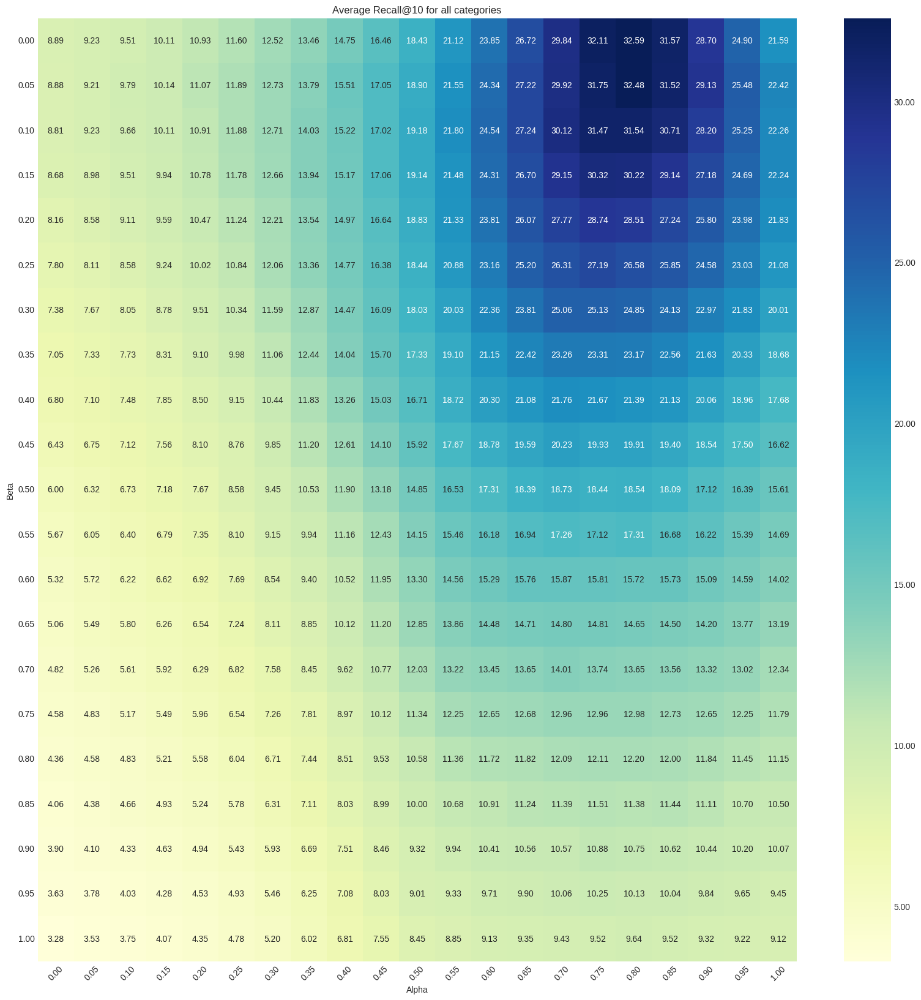

In [26]:
prepare_and_plot_recall_pivot(average_recall_at10, "Average Recall@10 for all categories")

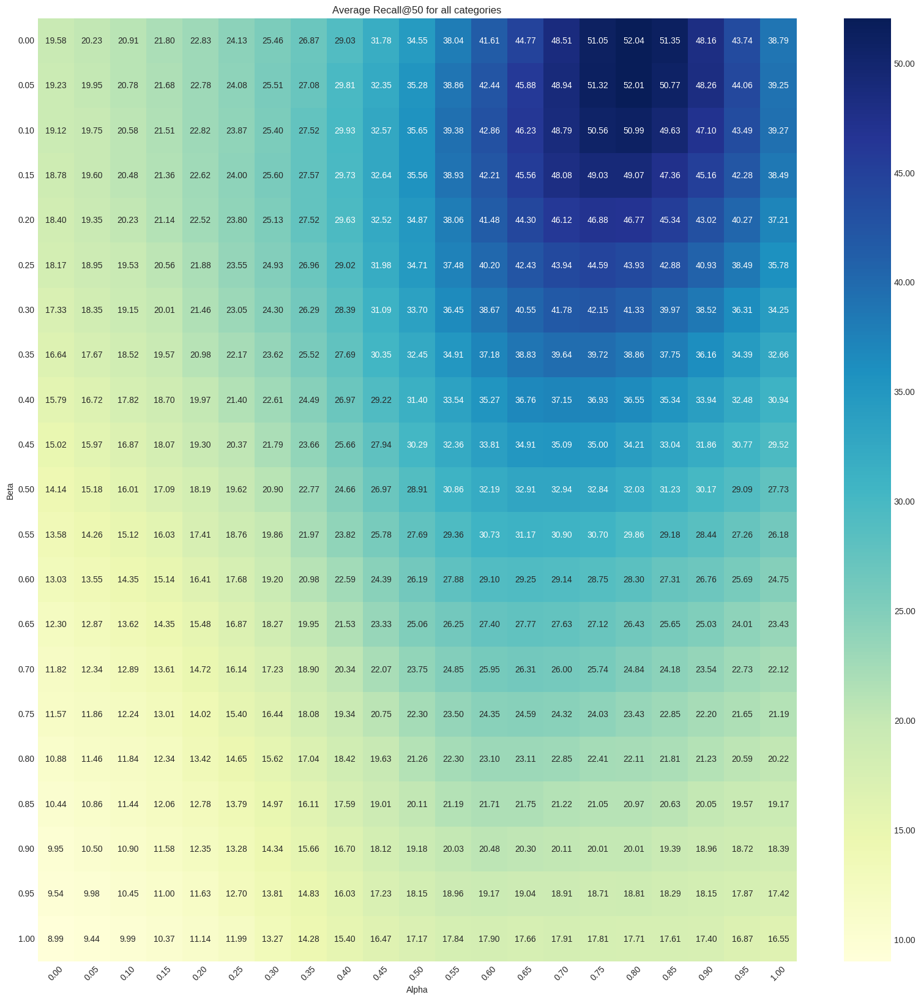

In [27]:
prepare_and_plot_recall_pivot(average_recall_at50, "Average Recall@50 for all categories")

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category</div>

In [28]:
sorted_indices_shirt, image_index_names_shirt, target_names_shirt = compute_results_fiq_val_clip(
    'shirt',
    get_combing_function_with_alpha(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    beta=0.1,
    cache=cache,
)

Recall at 10: 32.7772319316864
Recall at 50: 48.96957874298096


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category</div>

In [29]:
sorted_indices_dress, image_index_names_dress, target_names_dress = compute_results_fiq_val_clip(
    'dress',
    get_combing_function_with_alpha(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    beta=0.1,
    cache=cache,
)

Recall at 10: 25.8800208568573
Recall at 50: 47.29796648025513


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category</div>

In [30]:
sorted_indices_toptee, image_index_names_toptee, target_names_toptee = compute_results_fiq_val_clip(
    'toptee',
    get_combing_function_with_alpha(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    beta=0.1,
    cache=cache,
)

Recall at 10: 35.95104515552521
Recall at 50: 56.70576095581055


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [31]:
ground_truth_dress = prepare_ground_truths(json.load(open('../../../fashionIQ_dataset/captions/cap.dress.val.json')))
ground_truth_shirt = prepare_ground_truths(json.load(open('../../../fashionIQ_dataset/captions/cap.shirt.val.json')))
ground_truth_toptee = prepare_ground_truths(json.load(open('../../../fashionIQ_dataset/captions/cap.toptee.val.json')))

DATASET_IMAGE_DIR = '../../../fashionIQ_dataset/images/'

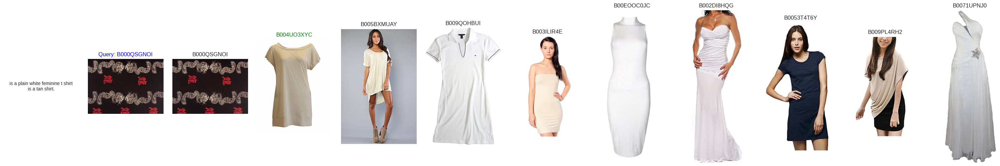

In [32]:
plot_retrieval_results_of_i(
    sorted_indices_dress, 
    image_index_names_dress, 
    target_names_dress, 
    ground_truth_dress, 
    top_k=10, 
    i=3,
    directory=DATASET_IMAGE_DIR,
)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with the original without MMLM captions and identical weights element-wise sum</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category</div>

In [33]:
sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin = compute_results_fiq_val_clip(
    'shirt',
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    beta=0,
    cache=cache,
)

Recall at 10: 21.050049364566803
Recall at 50: 36.70265078544617


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category</div>

In [34]:
sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin = compute_results_fiq_val_clip(
    'dress',
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    beta=0,
    cache=cache,
)

Recall at 10: 13.683688640594482
Recall at 50: 29.15220558643341


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category</div>

In [35]:
sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin = compute_results_fiq_val_clip(
    'toptee',
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    beta=0,
    cache=cache,
)

Recall at 10: 20.550739765167236
Recall at 50: 37.78684437274933


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Shirt category</div>

In [36]:
become_better = found_better_than_original(
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    top_k=10
)

len(become_better), become_better[:10]

(349, [13, 19, 20, 26, 34, 37, 40, 42, 47, 49])

In [37]:
become_worse = found_better_than_original(
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(102, [10, 28, 35, 66, 111, 116, 126, 175, 213, 222])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Dress category</div>

In [38]:
become_better = found_better_than_original(
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    top_k=10
)

len(become_better), become_better[:10]

(326, [1, 3, 12, 16, 19, 24, 27, 38, 40, 55])

In [39]:
become_worse = found_better_than_original(
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(71, [41, 61, 62, 87, 120, 134, 215, 218, 262, 277])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the TopTee category</div>

In [40]:
become_better = found_better_than_original(
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    top_k=10
)

len(become_better), become_better[:10]

(397, [4, 6, 7, 9, 16, 21, 24, 26, 28, 37])

In [41]:
become_worse = found_better_than_original(
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(82, [82, 122, 128, 230, 241, 292, 369, 389, 403, 410])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Shirt category</div>

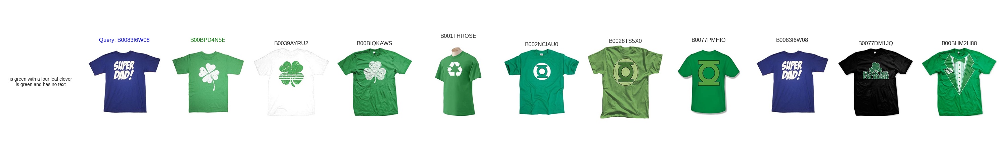

In [42]:
plot_retrieval_results_of_i(sorted_indices_shirt, image_index_names_shirt, target_names_shirt, ground_truth_shirt, top_k=10, i=1, directory=DATASET_IMAGE_DIR)

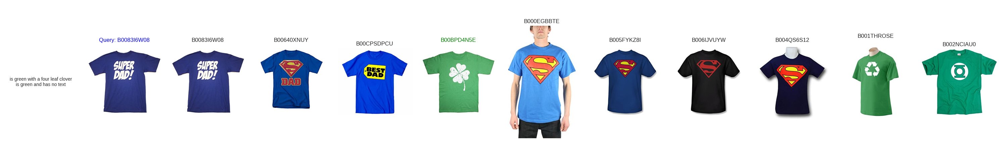

In [43]:
plot_retrieval_results_of_i(sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin, ground_truth_shirt, top_k=10, i=1, directory=DATASET_IMAGE_DIR)

In [ ]:
(102, [10, 28, 35, 66, 111, 116, 126, 175, 213, 222])

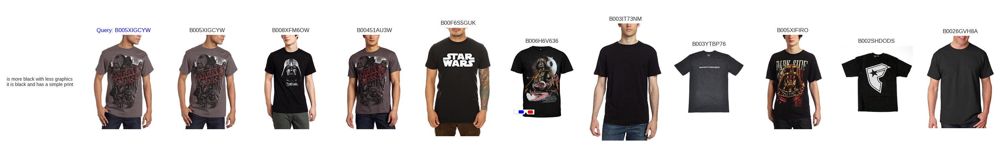

In [60]:
plot_retrieval_results_of_i(sorted_indices_shirt, image_index_names_shirt, target_names_shirt, ground_truth_shirt, top_k=10, i=111, directory=DATASET_IMAGE_DIR)

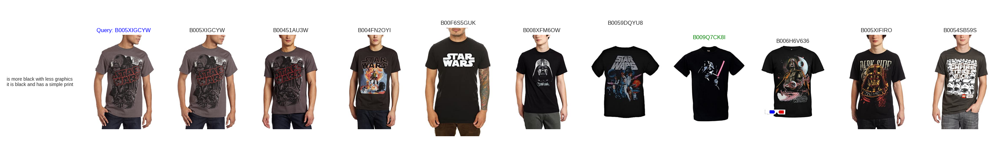

In [61]:
plot_retrieval_results_of_i(sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin, ground_truth_shirt, top_k=10, i=111, directory=DATASET_IMAGE_DIR)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Dress category</div>

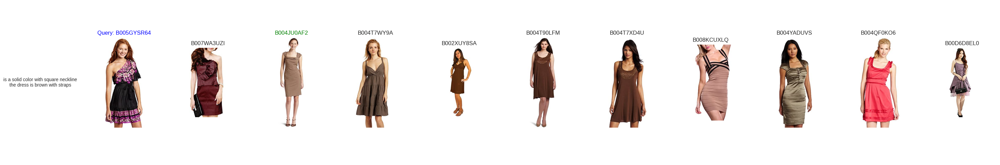

In [50]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=16, directory=DATASET_IMAGE_DIR)

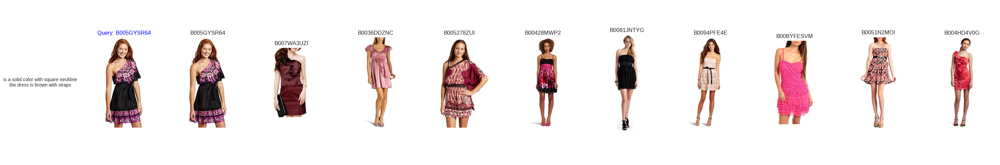

In [51]:
plot_retrieval_results_of_i(sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin, ground_truth_dress, top_k=10, i=16, directory=DATASET_IMAGE_DIR)

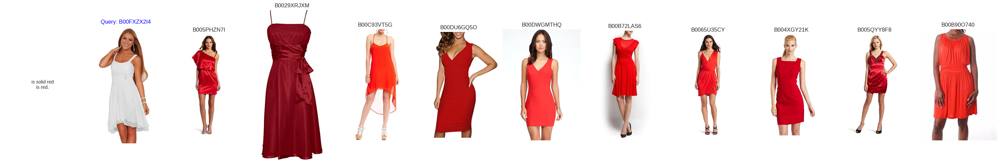

In [62]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=41, directory=DATASET_IMAGE_DIR)

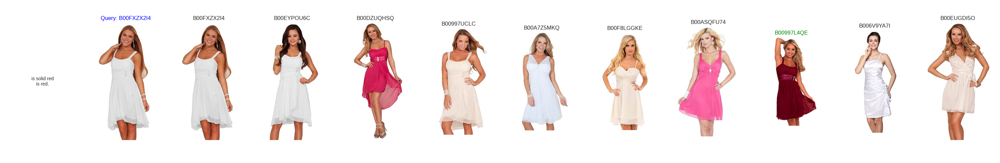

In [63]:
plot_retrieval_results_of_i(sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin, ground_truth_dress, top_k=10, i=41, directory=DATASET_IMAGE_DIR)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the TopTee category</div>

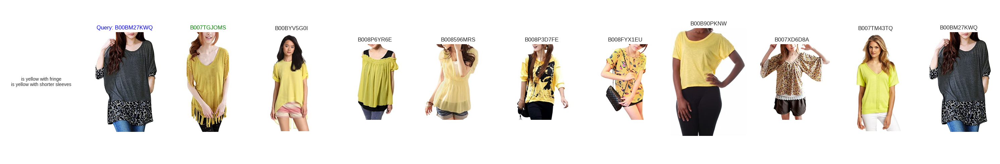

In [46]:
plot_retrieval_results_of_i(sorted_indices_toptee, image_index_names_toptee, target_names_toptee, ground_truth_toptee, top_k=10, i=2, directory=DATASET_IMAGE_DIR)

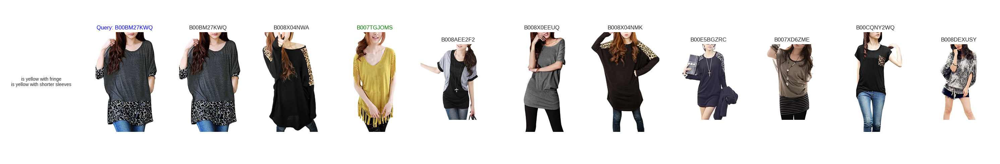

In [47]:
plot_retrieval_results_of_i(sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin, ground_truth_toptee, top_k=10, i=2, directory=DATASET_IMAGE_DIR)

In [ ]:
[82, 122, 128, 230, 241, 292, 369, 389, 403, 410]

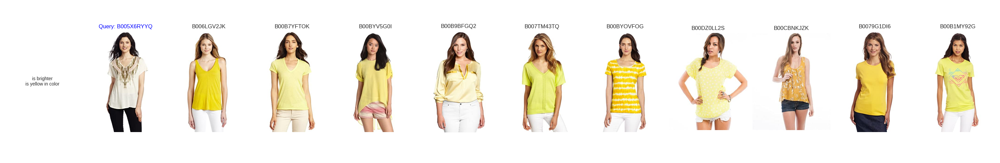

In [66]:
plot_retrieval_results_of_i(sorted_indices_toptee, image_index_names_toptee, target_names_toptee, ground_truth_toptee, top_k=10, i=122, directory=DATASET_IMAGE_DIR)

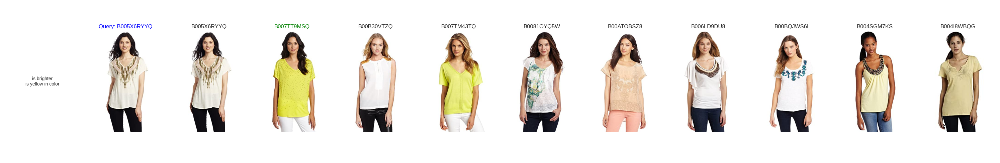

In [67]:
plot_retrieval_results_of_i(sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin, ground_truth_toptee, top_k=10, i=122, directory=DATASET_IMAGE_DIR)